# Polychromatic LGS

> A multi-level sodium system excited by 330 nm light

In [ ]:
from pylgs.all import *

Define a LGS system pumped by 330 nm light:

In [ ]:
lgs = LGSSystem(
    'Na330', 
    {
        'IntensitySI1': 5000.,
        'BFieldG': 0.5,
        'EllipticityDegrees1': 45.,
        'PolarizationAngleDegrees1': 0,
        'DetuningHz1': 1.0832e9,
        'LaserWidthHz1': 10.0e6,
        'MagneticZenithDegrees': 45.,
        'MagneticAzimuthDegrees': 45.,
        'SDampingCollisionRatePerS': 4081.63,
        'BeamTransitRatePerS': 131.944,
        'VccRatePerS': 28571.,
        'TemperatureK': 185.,
        'RecoilParameter': 1.
    }
)

The system is made up of 774 density-matrix elements describing 7 atomic levels:

In [ ]:
lgs.level_population.range

XarrayVectorSpace(
    coords=Coordinates:
             * Level                    (Level) <U16 448B '3D<sub>5/2</sub>' ... '3P<sub...
             * Density matrix (source)  (Density matrix (source)) <U68 211kB 'ρ<sub>Re, ...,
    name='Density matrix (source)')

In [ ]:
HTML(', '.join(lgs.level_population.range.coords['Level'].data))

## Steady-state model

### Adaptively refine velocity groups

Build a steady-state model with adaptively refined velocity groups:

In [ ]:
model = lgs.adaptive_stationary_model({}, max_weight=0.02)

Solve for the density matrix. There are 77 velocity groups in the model:

In [ ]:
sol = model.solve()
sol

XarrayVectorArray(
    XarrayVectorSpace(
        coords=Coordinates:
                 * Atomic velocity          (Atomic velocity) float64 616B -2.5 -1.5 ... 2.5
                 * Density matrix (source)  (Density matrix (source)) <U68 211kB 'ρ<sub>Re, ...),
    XarrayVectorArrayImpl(
        <xarray.DataArray (Atomic velocity: 77, Density matrix (source): 774)> Size: 477kB
        array([[ 4.81176696e-04,  5.34384235e-05, -5.34345938e-05, ...,
                -7.62458825e-08, -1.59213751e-10,  4.80994050e-10],
               [ 1.57799127e-02,  1.75251675e-03, -1.75236250e-03, ...,
                -4.16181990e-06, -1.44907755e-08,  3.47742694e-08],
               [ 1.36171022e-02,  1.51285759e-03, -1.51264943e-03, ...,
                -6.12658599e-06, -3.65981534e-08,  7.93942062e-08],
               ...,
               [ 3.46659939e-04,  4.29833209e-05, -4.25355901e-05, ...,
                 1.13082353e-07, -3.42891125e-10,  8.25195449e-10],
               [ 8.73281678e-04,  1.00106113e-04, -9.98471224e-05, ...,
                 2.02083018e-07, -5.61753217e-10,  1.43886197e-09],
               [ 4.79682003e-04,  5.35790757e-05, -5.35574606e-05, ...,
                 7.67513377e-08, -1.60052945e-10,  4.82714345e-10]])
        Coordinates:
          * Atomic velocity          (Atomic velocity) float64 616B -2.5 -1.5 ... 2.5
          * Density matrix (source)  (Density matrix (source)) <U68 211kB 'ρ<sub>Re, ...,
        <xarray.DataArray (Atomic velocity: 77, Density matrix (source): 774)> Size: 477kB
        array([[0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               ...,
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.]])
        Coordinates:
          * Atomic velocity          (Atomic velocity) float64 616B -2.5 -1.5 ... 2.5
          * Density matrix (source)  (Density matrix (source)) <U68 211kB 'ρ<sub>Re, ...),
    _len=1)

Plot the total return flux for each transition as a bar chart:

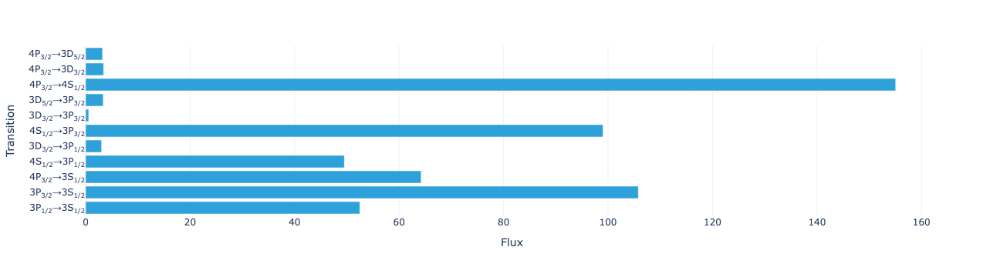

In [ ]:
model.total_flux(sol).visualize()

Plot the flux as a function of velocity:

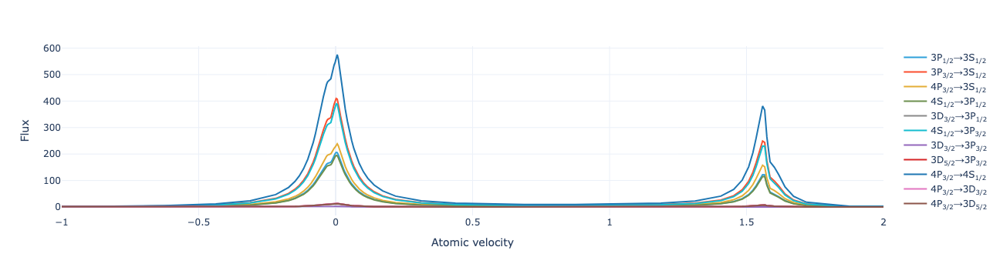

In [ ]:
model.flux_distribution(sol).visualize(xaxis_range=(-1, 2))

## Transient dynamics model

Build a model for the transient dynamics:

In [ ]:
model = lgs.instationary_model(
    vg=model.data['velocity_groups'], 
    T=1e-6, 
    num_values=101
)

Set tolerances for the BDF solver:

In [ ]:
pymor.basic.set_defaults({
    'pylgs.pymor.timestepping.cvode_solver_options.cvode_bdf_atol': 1e-6,
    'pylgs.pymor.timestepping.cvode_solver_options.cvode_bdf_rtol': 1e-5,
})

Solve for the density matrix as a function of time:

In [ ]:
sol = model.solve()

FloatProgress(value=0.0, bar_style='info', max=1e-06)

Plot the return flux for each transition:

In [ ]:
model.total_flux(sol).visualize()

Animate the level population distribution as a function of time:

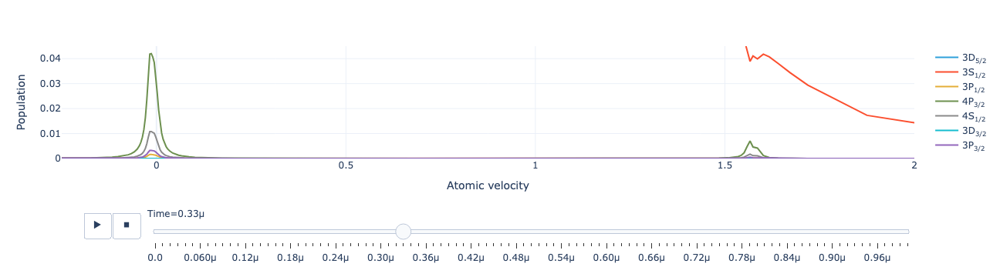

In [ ]:
model.level_population_distribution(sol).visualize(xaxis_range=(-.25, 2), yaxis_range=(0, .045))

In [ ]:
lgs.Flux

XarrayMatrixOperator(
    <xarray.DataArray 'Flux' (Transition: 11, Density matrix (source): 774)> Size: 4kB
    <COO: shape=(11, 774), dtype=float64, nnz=160, fill_value=0.0>
    Coordinates:
      * Transition               (Transition) <U33 1kB '3P<sub>1/2</sub>→3S<sub>1...
      * Density matrix (source)  (Density matrix (source)) <U68 211kB 'ρ<sub>Re, ...,
    source=XarrayVectorSpace(
               coords=Coordinates:
                        * Density matrix (source)  (Density matrix (source)) <U68 211kB 'ρ<sub>Re, ...),
    range=XarrayVectorSpace(
              coords=Coordinates:
                       * Transition  (Transition) <U33 1kB '3P<sub>1/2</sub>→3S<sub>1/2</sub>' ......,
              name='Flux'),
    name='Flux')